In [ ]:
pip install youtube_dl

     |████████████████████████████████| 1.9MB 8.7MB/s 


In [ ]:
pip install pafy

In [ ]:
# importing all required libraries

import os
import cv2
import math
import pafy
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline

from tensorflow.keras.layers import *
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.model_selection import train_test_split

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2105344/45929032 bytes (4.6%)5701632/45929032 bytes (12.4%)9650176/45929032 bytes (21.0%)13574144/45929032 bytes (29.6%)17317888/45929032 bytes (37.7%)21168128/45929032 bytes (46.1%)25067520/45929032 bytes (54.6%)28868608/45929032 bytes (62.9%)32653312/45929032 bytes (71.1%)36200448/45929032 bytes (78.8%)39673856/45929032 bytes (86.4%)43089920/45929032 bytes (93.8%)

In [ ]:
# setting numpy, python and tensorflow seeds to get consistent results

seed_constant = 25
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [ ]:
# downloading the UCF50 – Action Recognition Dataset
# datset link :: https://www.crcv.ucf.edu/data/UCF50.php

!wget -nc --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

--2021-06-18 16:27:08--  https://www.crcv.ucf.edu/data/UCF50.rar
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 3233554570 (3.0G) [application/rar]
Saving to: ‘UCF50.rar’

UCF50.rar           100%[===================>]   3.01G  38.7MB/s    in 78s     

2021-06-18 16:28:26 (39.4 MB/s) - ‘UCF50.rar’ saved [3233554570/3233554570]



In [ ]:
# extracting the datset

!unrar x UCF50.rar -inul -y

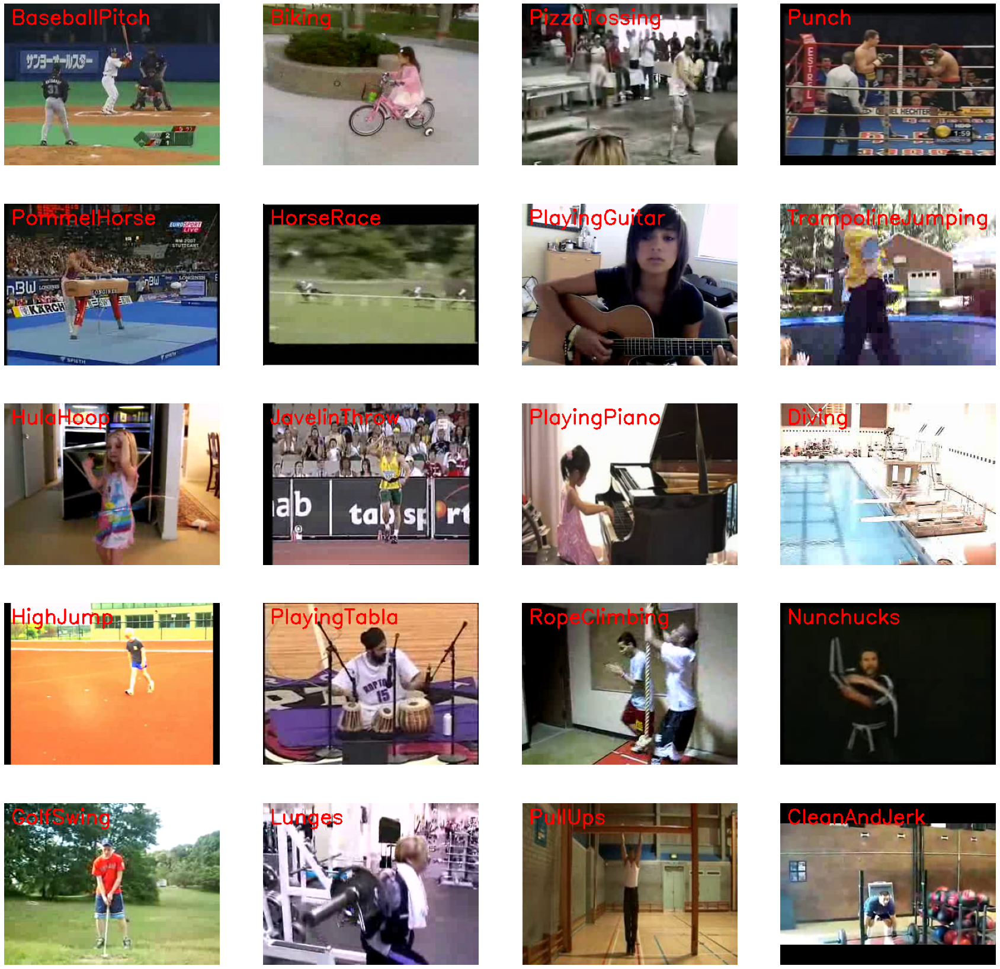

In [ ]:
# picking some random videos from each class of the dataset and displaying it

# Create a Matplotlib figure
plt.figure(figsize = (30, 30))

# Get Names of all classes in UCF50
all_classes_names = os.listdir('UCF50')

# Generate a random sample of images each time the cell runs
random_range = random.sample(range(len(all_classes_names)), 20)

# Iterating through all the random samples
for counter, random_index in enumerate(random_range, 1):

    # Getting Class Name using Random Index
    selected_class_Name = all_classes_names[random_index]

    # Getting a list of all the video files present in a Class Directory
    video_files_names_list = os.listdir(f'UCF50/{selected_class_Name}')

    # Randomly selecting a video file
    selected_video_file_name = random.choice(video_files_names_list)

    # Reading the Video File Using the Video Capture
    video_reader = cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')
    
    # Reading The First Frame of the Video File
    _, bgr_frame = video_reader.read()

    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()

    # Converting the BGR Frame to RGB Frame 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Adding The Class Name Text on top of the Video Frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    
    # Assigning the Frame to a specific position of a subplot
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')

In [ ]:
# preprocessing the dataset

# resize all frames of the video to reduce size of computation
image_height, image_width = 64, 64

# setting the maximum number of training images allowed for each class
max_images_per_class = 8000

# path of the directory containing the extracted dataset
dataset_directory = "UCF50"

# the list of classes to trained training
classes_list = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]

model_output_size = len(classes_list)

In [ ]:
'''
Input : video_path :: path of the video

Process :: This function takes a video file path as input. It then reads the video file frame by frame, resizes each frame, normalizes the resized frame, 
appends the normalized frame into a list, and then finally returns that list.
    
Output :: frames_list :: list of image frames for the given vedio'''

def frames_extraction(video_path):
    # Empty List declared to store video frames
    frames_list = []
    
    # Reading the Video File Using the VideoCapture
    video_reader = cv2.VideoCapture(video_path)

    # Iterating through Video Frames
    while True:

        # Reading a frame from the video file 
        success, frame = video_reader.read() 

        # If Video frame was not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        
        # Appending the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()

    # returning the frames list 
    return frames_list

In [ ]:
'''
Input :: None

Process :: This function iterates through all the classes mentioned in the classes_list and for each class iterate through all the video files present in it.
The fuction then call the frame_extraction method on each video file and add the returned frames to a list called temp_features. After all videos of a class 
are processed, function randomly select video frames (equal to max_images_per_class) and add them to the list called features. It also adds labels of the 
selected videos to the `labels` list, finally when all videos of all the classes are processed then, function return the features and labels as NumPy arrays.

Output :: features :: frames of all vedio classes , labels :: class label of all frames'''

def create_dataset():

    # Declaring Empty Lists to store the features and labels values.
    temp_features = [] 
    features = []
    labels = []
    
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(classes_list):
        print(f'Extracting Data of Class: {class_name}')
        
        # Getting the list of video files present in the specific class name directory
        files_list = os.listdir(os.path.join(dataset_directory, class_name))

        # Iterating through all the files present in the files list
        for file_name in files_list:

            # Construct the complete video path
            video_file_path = os.path.join(dataset_directory, class_name, file_name)

            # Calling the frame_extraction method for every video file path
            frames = frames_extraction(video_file_path)

            # Appending the frames to a temporary list.
            temp_features.extend(frames)
        
        # Adding randomly selected frames to the features list
        features.extend(random.sample(temp_features, max_images_per_class))

        # Adding Fixed number of labels to the labels list
        labels.extend([class_index] * max_images_per_class)
        
        # Emptying the temp_features list so it can be reused to store all frames of the next class.
        temp_features.clear()

    # Converting the features and labels lists to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  

    return features, labels

In [ ]:
# loading all features and labels

features, labels = create_dataset()

Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace


In [ ]:
# using Keras's to_categorical method to convert labels into one-hot-encoded vectors

one_hot_encoded_labels = to_categorical(labels)

In [ ]:
# split our data to create a training, and a testing set

features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = seed_constant)

In [ ]:
# create a function that will construct the model

def create_model():

    # We will use a Sequential model for model construction
    model = Sequential()

    # Defining The Model Architecture
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', input_shape = (image_height, image_width, 3)))
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(model_output_size, activation = 'softmax'))

    # Printing the models summary
    model.summary()

    return model

# calling the create_model method
model = create_model()

print("Model Created Successfully!")

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 62, 62, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 60, 60, 64)        36928     
_________________________________________________________________
batch_normalization (BatchNo (None, 60, 60, 64)        256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 30, 30, 64)        0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 256)               16640     
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1

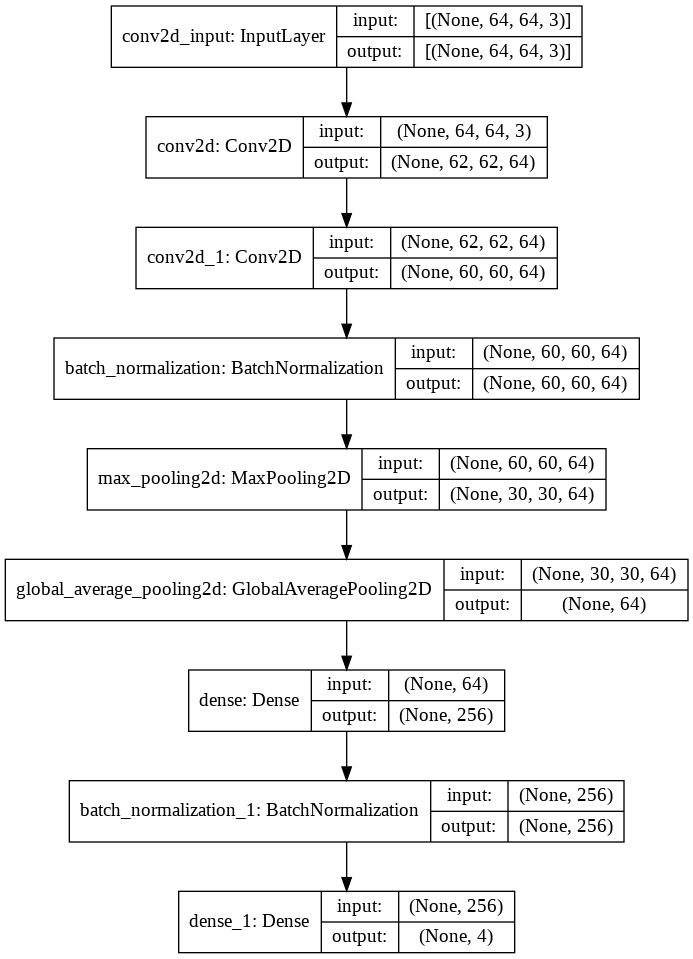

In [ ]:
# checking the structure of the final model

plot_model(model, to_file = 'model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [ ]:
# compiling and training the model

# adding Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)

# adding loss, optimizer and metrics values to the model.
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# start Training
model_training_history = model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4 , shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/50
5120/5120 [==============================] - 51s 4ms/step - loss: 0.8556 - accuracy: 0.6573 - val_loss: 1.2355 - val_accuracy: 0.5314
Epoch 2/50
5120/5120 [==============================] - 20s 4ms/step - loss: 0.5220 - accuracy: 0.8066 - val_loss: 0.4537 - val_accuracy: 0.8387
Epoch 3/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.3845 - accuracy: 0.8661 - val_loss: 0.1776 - val_accuracy: 0.9387
Epoch 4/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.3129 - accuracy: 0.8907 - val_loss: 0.5354 - val_accuracy: 0.8178
Epoch 5/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.2828 - accuracy: 0.9044 - val_loss: 0.3568 - val_accuracy: 0.8859
Epoch 6/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.2506 - accuracy: 0.9164 - val_loss: 0.5068 - val_accuracy: 0.8646
Epoch 7/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.2398 - accuracy: 0.9182 - val_loss: 0.2189 - val_ac

In [ ]:
# load a pretrained model

# model_name = 
# model = load_model(model_name)

In [ ]:
# evaluating resultant model

model_evaluation_history = model.evaluate(features_test, labels_test)

200/200 [==============================] - 1s 5ms/step - loss: 0.0395 - accuracy: 0.9891


In [ ]:
# creating a useful name for the model and then saving the model
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
model_name = f'Model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
 
model.save(model_name)

In [ ]:
# function for ploting loss and accuracy curves

def plot_metric(metric_name_1, metric_name_2, plot_name):
  # Get Metric values using metric names as identifiers
  metric_value_1 = model_training_history.history[metric_name_1]
  metric_value_2 = model_training_history.history[metric_name_2]

  # Constructing a range object which will be used as time 
  epochs = range(len(metric_value_1))
  
  # Plotting the Graph
  plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
  
  # Adding title to the plot
  plt.title(str(plot_name))

  # Adding legend to the plot
  plt.legend()

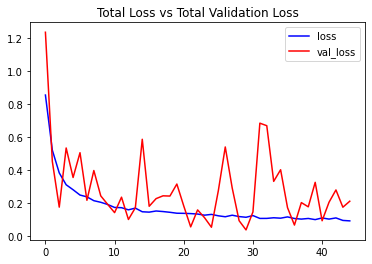

In [ ]:
	plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')

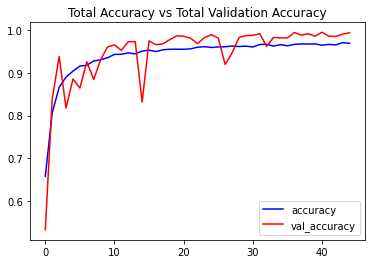

In [ ]:
	plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

In [ ]:
# making predictions with the Model

In [ ]:
'''
This function will use pafy library to download any youtube video by passing the video URL as the input and 
it returns the video title
'''

def download_youtube_videos(youtube_video_url, output_directory):
    # Creating a Video object which includes useful information regarding the youtube video.
    video = pafy.new(youtube_video_url)

    # Getting the best available quality object for the youtube video.
    video_best = video.getbest()

    # Constructing the Output File Path
    output_file_path = f'{output_directory}/{video.title}.mp4'

    # Downloading the youtube video at the best available quality.
    video_best.download(filepath = output_file_path, quiet = True)

    # Returning Video Title
    return video.title

In [ ]:
'''
This function will perform predictions on live videos using moving_average
If we set window_size hyperparameter to 1, this function will behave like a normal classifier to predict video frames
'''

def predict_on_live_video(video_file_path, output_file_path, window_size):

    # Initialize a Deque Object with a fixed size which will be used to implement moving/rolling average functionality.
    predicted_labels_probabilities_deque = deque(maxlen = window_size)

    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)

    # Getting the width and height of the video 
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Writing the Overlayed Video Files Using the VideoWriter Object
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 24, (original_video_width, original_video_height))

    while True: 

        # Reading The Frame
        status, frame = video_reader.read() 

        if not status:
            break

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]

        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_deque.append(predicted_labels_probabilities)

        # Assuring that the Deque is completely filled before starting the averaging process
        if len(predicted_labels_probabilities_deque) == window_size:

            # Converting Predicted Labels Probabilities Deque into Numpy array
            predicted_labels_probabilities_np = np.array(predicted_labels_probabilities_deque)

            # Calculating Average of Predicted Labels Probabilities Column Wise 
            predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)

            # Converting the predicted probabilities into labels by returning the index of the maximum value.
            predicted_label = np.argmax(predicted_labels_probabilities_averaged)

            # Accessing The Class Name using predicted label.
            predicted_class_name = classes_list[predicted_label]
          
            # Overlaying Class Name Text Ontop of the Frame
            cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        # Writing The Frame
        video_writer.write(frame)


        # cv2.imshow('Predicted Frames', frame)

        # key_pressed = cv2.waitKey(10)

        # if key_pressed == ord('q'):
        #     break

    # cv2.destroyAllWindows()

    
    # Closing the VideoCapture and VideoWriter objects and releasing all resources held by them. 
    video_reader.release()
    video_writer.release()

In [ ]:
# downloading a test Video:

# creating The Output directories if it does not exist
output_directory = 'Youtube_Videos'
os.makedirs(output_directory, exist_ok = True)

# Downloading a YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE', output_directory)

# Getting the YouTube Video's path you just downloaded
input_video_file_path = f'{output_directory}/{video_title}.mp4'

In [ ]:
# results Without Using Moving Average

# Setting sthe Window Size which will be used by the Rolling Average Proces
window_size = 1

# Constructing The Output YouTube Video Path
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}.mp4'

# Calling the predict_on_live_video method to start the Prediction.
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)

# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700)

100%|██████████| 866/866 [00:01<00:00, 753.75it/s]


In [ ]:
# results When Using Moving Average

# Setting the Window Size which will be used by the Rolling Average Process
window_size = 25

# Constructing The Output YouTube Video Path
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}.mp4'

# Calling the predict_on_live_video method to start the Prediction and Rolling Average Process
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)

# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700)

100%|██████████| 866/866 [00:01<00:00, 745.00it/s]


In [ ]:
'''
This function will output a singular prediction for the complete video by taking `n` frames from the entire video and 
making predictions. In the end, it will average the predictions of those n frames to give us the final activity class 
for that video. We can set the value of n using the predictions_frames_count variable.

This function is useful when you have a video containing one activity and you want to know the activity’s name and its score.
'''

def make_average_predictions(video_file_path, predictions_frames_count):
    
    # Initializing the Numpy array which will store Prediction Probabilities
    predicted_labels_probabilities_np = np.zeros((predictions_frames_count, model_output_size), dtype = np.float)

    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)

    # Getting The Total Frames present in the video 
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculating The Number of Frames to skip Before reading a frame
    skip_frames_window = video_frames_count // predictions_frames_count

    for frame_counter in range(predictions_frames_count): 

        # Setting Frame Position
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading The Frame
        _ , frame = video_reader.read() 

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]

        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_np[frame_counter] = predicted_labels_probabilities

    # Calculating Average of Predicted Labels Probabilities Column Wise 
    predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)

    # Sorting the Averaged Predicted Labels Probabilities
    predicted_labels_probabilities_averaged_sorted_indexes = np.argsort(predicted_labels_probabilities_averaged)[::-1]

    # Iterating Over All Averaged Predicted Label Probabilities
    for predicted_label in predicted_labels_probabilities_averaged_sorted_indexes:

        # Accessing The Class Name using predicted label.
        predicted_class_name = classes_list[predicted_label]

        # Accessing The Averaged Probability using predicted label.
        predicted_probability = predicted_labels_probabilities_averaged[predicted_label]

        print(f"CLASS NAME: {predicted_class_name}   AVERAGED PROBABILITY: {(predicted_probability*100):.2}")
    
    # Closing the VideoCapture Object and releasing all resources held by it. 
    video_reader.release()

In [ ]:
# testing Average Prediction Method On Youtube Videos

# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=ceRjxW4MpOY', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: TaiChi   AVERAGED PROBABILITY: 1e+02
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 1.5e-05
CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 7.4e-06
CLASS NAME: Swing   AVERAGED PROBABILITY: 1.1e-09


100%|██████████| 1322/1322 [00:02<00:00, 660.71it/s]


In [ ]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=ayI-e3cJM-0', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 6.7e+01
CLASS NAME: Swing   AVERAGED PROBABILITY: 3.3e+01
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 0.02
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 0.0041


100%|██████████| 1650/1650 [00:24<00:00, 66.60it/s]


In [ ]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=XqqpZS0c1K0', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 9.7e+01
CLASS NAME: Swing   AVERAGED PROBABILITY: 3.4
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 0.00053
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 2.7e-14


100%|██████████| 1651/1651 [00:24<00:00, 67.69it/s]


In [ ]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=WHBu6iePxKc', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: HorseRace   AVERAGED PROBABILITY: 8.1e+01
CLASS NAME: Swing   AVERAGED PROBABILITY: 1.3e+01
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 6.0
CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 0.014


100%|██████████| 1651/1651 [00:22<00:00, 73.48it/s]


In [ ]:
# Refrences ::
# https://www.crcv.ucf.edu/data/UCF50.php
# https://learnopencv.com/introduction-to-video-classification-and-human-activity-recognition/